# Search for YSOs cont'd

## Loading and Importing

In [1]:
%matplotlib inline

In [2]:
basepath = '/orange/adamginsburg/jwst/brick/'

In [3]:
cd $basepath

/blue/adamginsburg/adamginsburg/jwst/brick


In [4]:
import sys
if '' in sys.path:
    sys.path.remove('')

In [5]:
%run $basepath/analysis/analysis_setup.py

/blue/adamginsburg/adamginsburg/jwst/brick/analysis/analysis_setup.py:4: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import sys, imp
/blue/adamginsburg/adamginsburg/jwst/brick/analysis/analysis_setup.py:24: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.aperture.CircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import CircularAperture` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/blue/adamginsburg/adamginsburg/jwst/brick/analysis/analysis_setup.py:24: DeprecationWarning: `photutils.EPSFBuilder` is a deprecated alias for `photutils.psf.EPSFBuilder` and will be removed in the future. Instead, please use `from photutils.psf import EPSFBuilder` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/blue/ada

For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2024-06-29 07:19:49
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2024-06-29 23:27:00


In [6]:
%run $basepath/analysis/selections.py --module=merged1182_daophot_basic_bgsub_blur

Set DATE-AVG to '2022-08-28T03:05:32.473' from MJD-AVG.
Set DATE-END to '2022-08-28T03:34:03.557' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.661125 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526408297.850 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2024-06-29 07:19:49
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2024-06-29 23:27:00
Selecting module merged1182_daophot_basic_bgsub_blur

merged1182_daophot_basic_bgsub_blur
Selecting based on filters ['f410m', 'f212n', 'f466n', 'f405n', 'f187n', 'f182m', 'f444w', 'f356w', 'f200w', 'f115w']
1466 saturated in near_saturated_f212n_f212n
114 saturated in near_saturated_f466n_f466n
938 saturated in near_saturated_f405n_f405n
657 saturated in near_saturated_f187n_f187n
10719 saturated in near_saturated_f182m_f182m
25353 saturated in near_saturated_f444w_f444w
28364 saturated in near_saturated_f356w_f356w
36060 saturated in near_saturated_f200w_f200w
1747 saturated in near_saturated_f115w_f115w
62978 near saturated out of 1553496.  That leaves 1490518 not near unsaturated
1466 saturated in near_saturated_f212n_f212n
114 saturated 

In [8]:
import pylab as pl

import numpy as np
from astropy import units as u
from astropy.io import ascii
from astropy.table import Table
from astropy.visualization import simple_norm

import analysis_setup
import selections
import plot_tools
from plot_tools import plot_extvec_ccd

#from analysis_setup import filternames, basepath, img
from analysis_setup import fh_merged_reproject as fh, ww410_merged_reproject as ww410, ww410_merged_reproject as ww
#from selections import main, basetable_merged_reproject, basetable_merged_reproject  as basetable

# print()
# print("merged-reproject")
# result = main(basetable_merged_reproject, ww=ww)
# all_good = result['all_good']
# any_good = result['any_good']
# any_saturated = result['any_saturated']
# long_good = result['long_good']
# bad = result['bad']
# globals().update({key+"_mr": val for key, val in result.items()})

## Plotting using paper-like figures

Selected 41741 stars for the colorcolor diagram plot


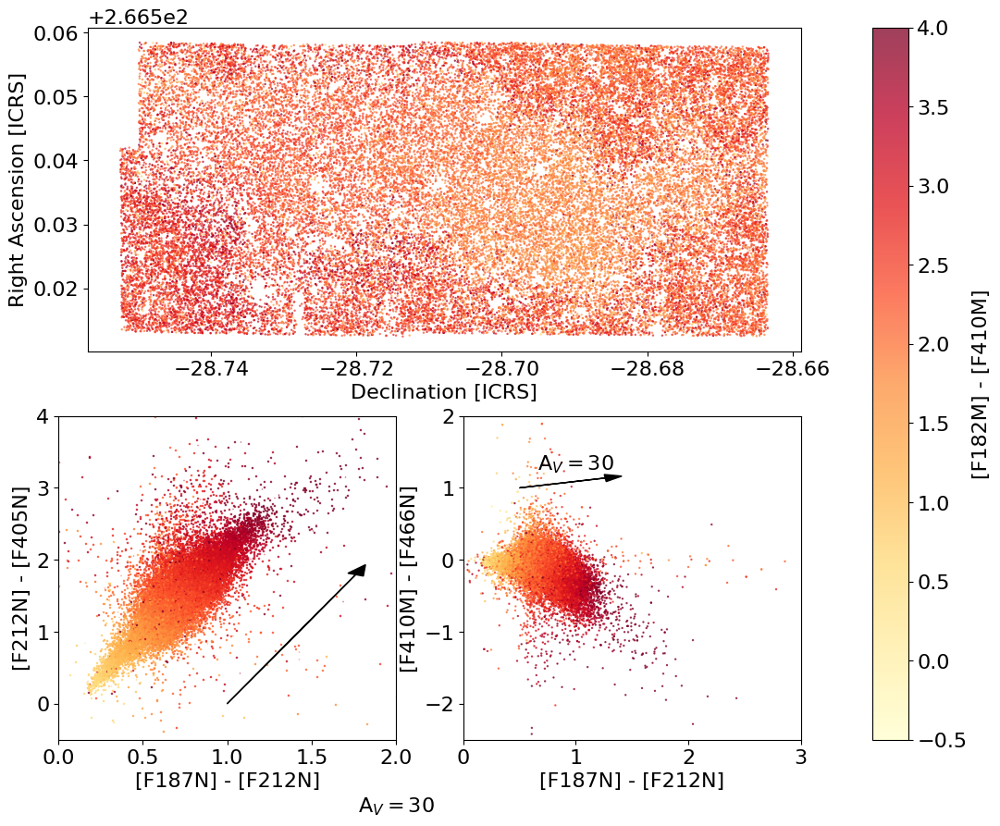

In [22]:
pl.figure(figsize=(20,10))
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
sel &= basetable['mag_ab_f410m'] < 18.5
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1, 0,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor diagram plot")

Selected 20686 stars for the colorcolor digram plot


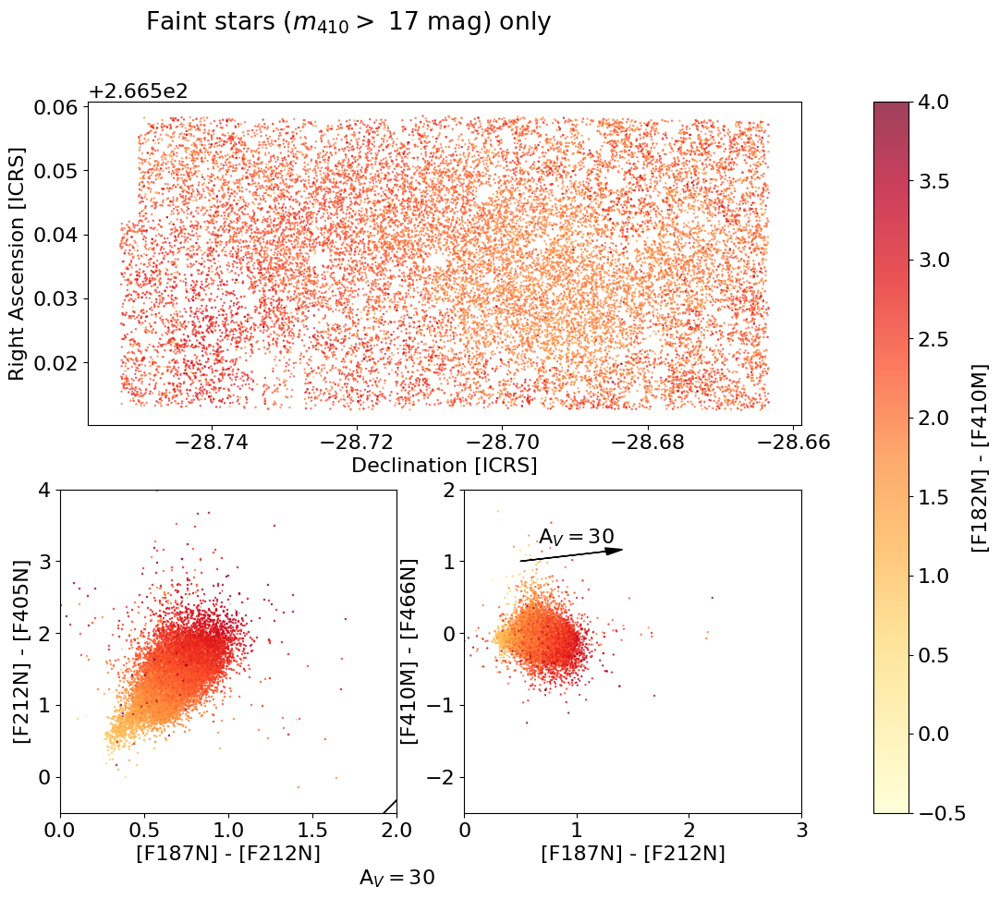

In [27]:
pl.figure(figsize=(20,10))
pl.suptitle("Faint stars ($m_{410} > $ 17 mag) only")
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
#sel &= basetable['mag_ab_f410m'] < 18.5
sel &= basetable['mag_ab_f410m'] > 17
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1.5,-1.5,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor digram plot")

Selected 21504 stars for the colorcolor digram plot


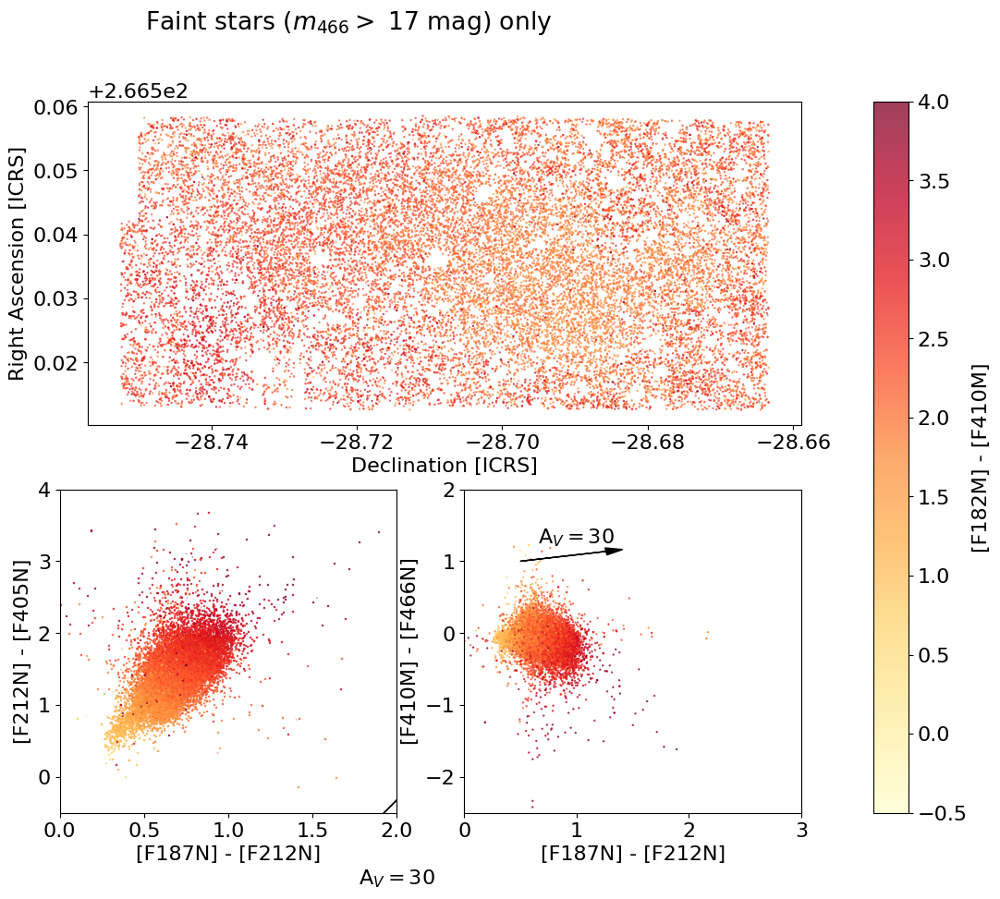

In [28]:
pl.figure(figsize=(20,10))
pl.suptitle("Faint stars ($m_{466} > $ 17 mag) only")
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
#sel &= basetable['mag_ab_f410m'] < 18.5
sel &= basetable['mag_ab_f466n'] > 17
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1.5,-1.5,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor digram plot")

Selected 32797 stars for the colorcolor digram plot


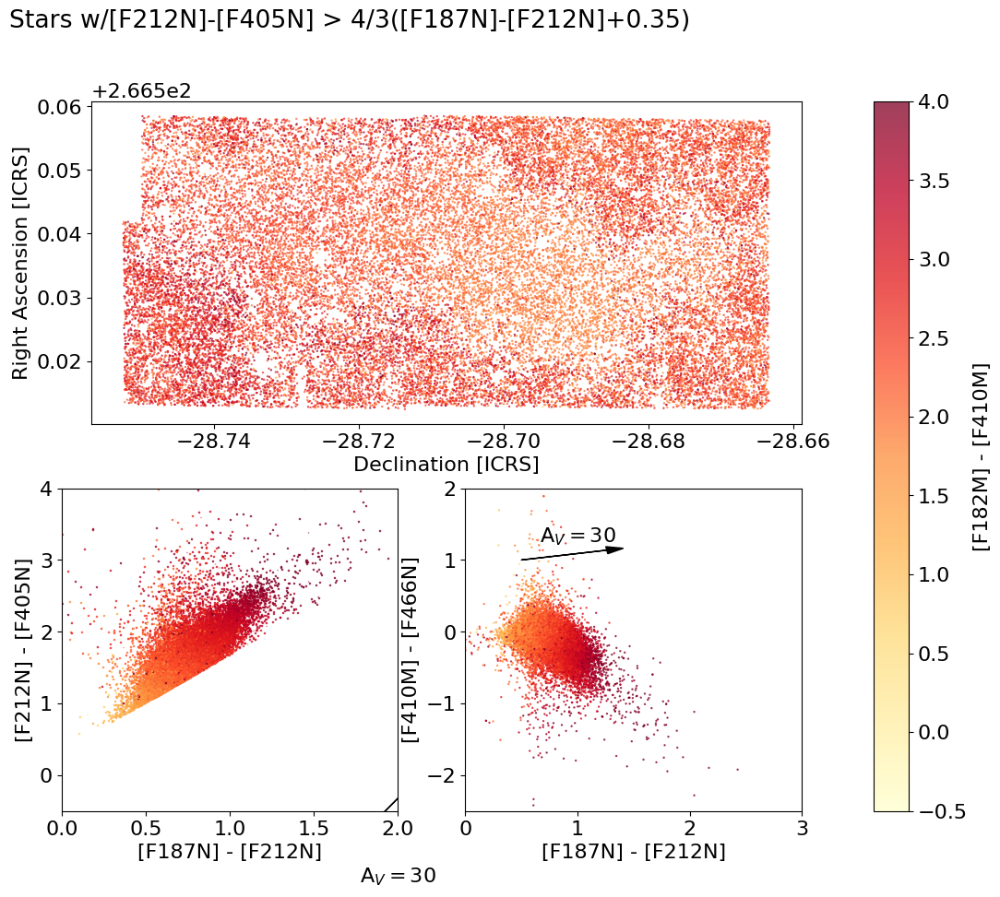

In [24]:
pl.figure(figsize=(20,10))
pl.suptitle("Stars w/[F212N]-[F405N] > 4/3([F187N]-[F212N]+0.35)")
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
#sel &= basetable['mag_ab_f410m'] < 18.5
#sel &= basetable['mag_ab_f410m'] > 17

c187_212 = basetable['mag_ab_f187n'] - basetable['mag_ab_f212n']
c212_405 = basetable['mag_ab_f212n'] - basetable['mag_ab_f405n']

sel &= c212_405 > c187_212 * (4/3.) + 0.35

xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1.5,-1.5,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor digram plot")

# Blue BrA PaA

Selected 867 stars for the colorcolor diagram plot


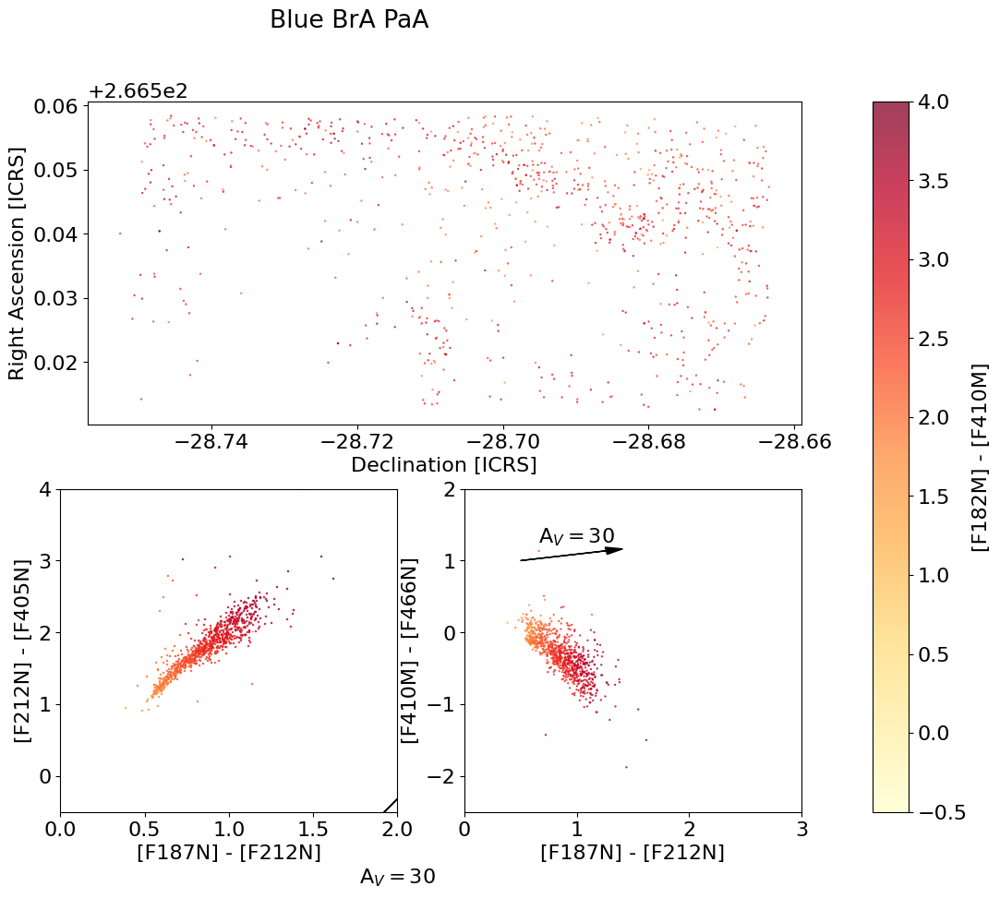

In [63]:
pl.figure(figsize=(20,10))
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
sel &= (basetable['qfit_f410m'] < 0.1) & (basetable['qfit_f405n'] < 0.1)
sel &= (basetable['qfit_f182m'] < 0.1) & (basetable['qfit_f187n'] < 0.1)
#sel &= basetable['mag_ab_f410m'] < 18.5
#sel &= basetable['mag_ab_f410m'] > 17

c187_212 = basetable['mag_ab_f187n'] - basetable['mag_ab_f212n']
c212_405 = basetable['mag_ab_f212n'] - basetable['mag_ab_f405n']

#sel &= c212_405 > c187_212 * (4/3.) + 0.35
sel &= blue_BrA_and_PaA

xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1.5,-1.5,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor diagram plot")
pl.suptitle("Blue BrA PaA");

Selected 267 stars for the colorcolor diagram plot


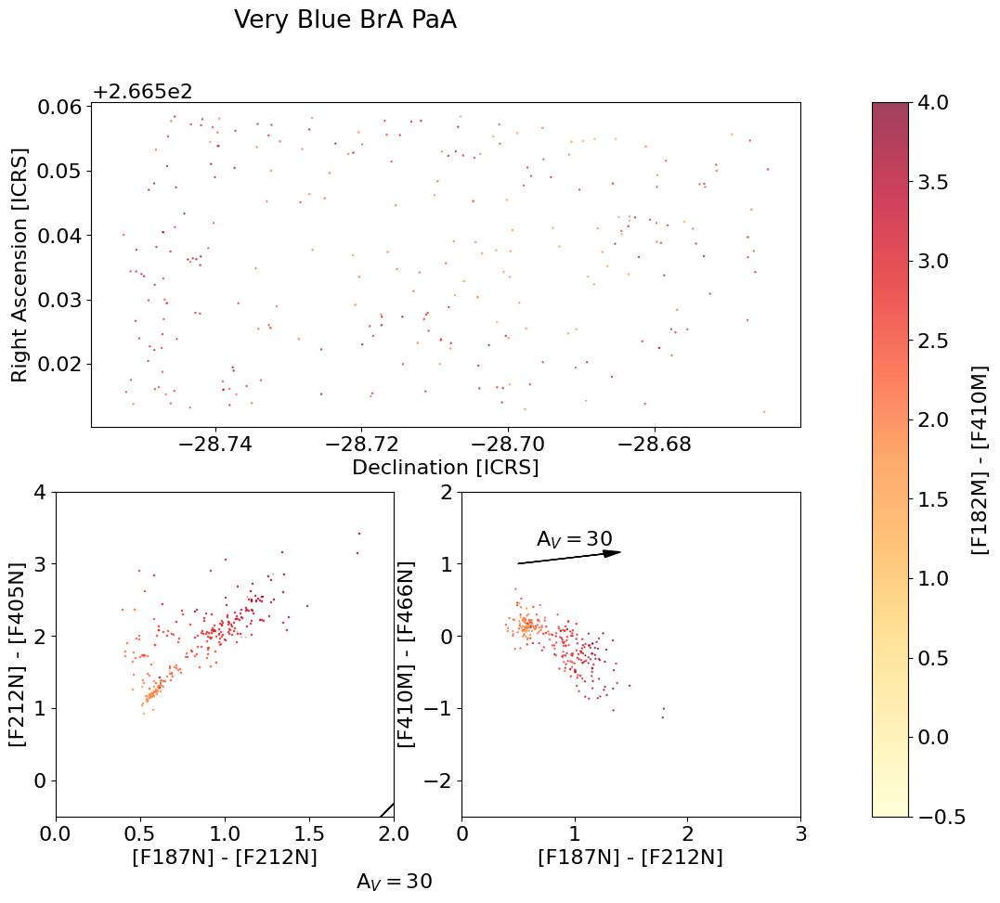

In [57]:
pl.figure(figsize=(20,10))
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
#sel &= basetable['mag_ab_f410m'] < 18.5
#sel &= basetable['mag_ab_f410m'] > 17

c187_212 = basetable['mag_ab_f187n'] - basetable['mag_ab_f212n']
c212_405 = basetable['mag_ab_f212n'] - basetable['mag_ab_f405n']

#sel &= c212_405 > c187_212 * (4/3.) + 0.35
prettyblue_BrA_and_PaA = (blue_BrA_and_PaA &
                 ((basetable['mag_ab_f187n'] - basetable['mag_ab_f182m']) +
                  (basetable['emag_ab_f182m']**2 + basetable['emag_ab_f187n']**2)**0.5 < -0.2) &
                 ((basetable['mag_ab_f405n'] - basetable['mag_ab_f410m']) +
                  (basetable['emag_ab_f410m']**2 + basetable['emag_ab_f405n']**2)**0.5 < -0.2)
                       )
sel &= prettyblue_BrA_and_PaA

xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1.5,-1.5,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor diagram plot")
pl.suptitle("Pretty Blue BrA PaA");

Selected 1357 stars for the colorcolor diagram plot


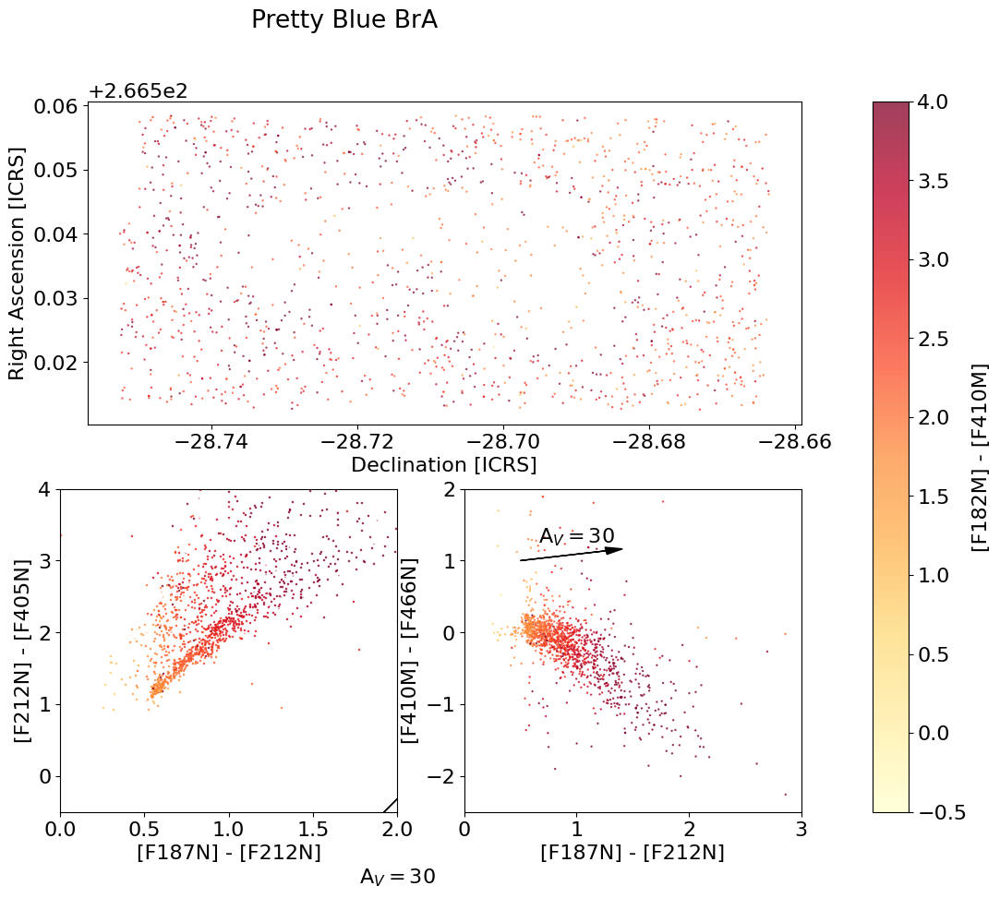

In [62]:
pl.figure(figsize=(20,10))
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good
sel &= (basetable['qfit_f410m'] < 0.1) & (basetable['qfit_f405n'] < 0.1)
#sel &= basetable['mag_ab_f410m'] < 18.5
#sel &= basetable['mag_ab_f410m'] > 17

c187_212 = basetable['mag_ab_f187n'] - basetable['mag_ab_f212n']
c212_405 = basetable['mag_ab_f212n'] - basetable['mag_ab_f405n']

#sel &= c212_405 > c187_212 * (4/3.) + 0.35
prettyblue_BrA = (
    ((basetable['mag_ab_f405n'] - basetable['mag_ab_f410m']) +
     (basetable['emag_ab_f410m']**2 + basetable['emag_ab_f405n']**2)**0.5 < -0.2)
                       )
sel &= prettyblue_BrA

xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1.5,-1.5,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor diagram plot")
pl.suptitle("Pretty Blue BrA ");

In [60]:
10**(0.2/2.5)

1.202264434617413

In [14]:
basetable[:2]

skycoord_ref,skycoord_ref_filtername,sep_f410m,id_f410m_1,skycoord_centroid_f410m,skycoord_f410m,id_f410m_2,group_id_f410m,group_size_f410m,local_bkg_f410m,x_init_f410m,y_init_f410m,flux_init_f410m,x_fit_f410m,y_fit_f410m,flux_f410m,x_err_f410m,y_err_f410m,flux_err_f410m,npixfit_f410m,qfit_f410m,cfit_f410m,flags_f410m,mask_f410m,flux_jy_f410m,mag_ab_f410m,eflux_jy_f410m,emag_ab_f410m,near_saturated_f410m_f410m,replaced_saturated_f410m,sep_f212n,id_f212n_1,skycoord_centroid_f212n,skycoord_f212n,id_f212n_2,group_id_f212n,group_size_f212n,local_bkg_f212n,x_init_f212n,y_init_f212n,flux_init_f212n,x_fit_f212n,y_fit_f212n,flux_f212n,x_err_f212n,y_err_f212n,flux_err_f212n,npixfit_f212n,qfit_f212n,cfit_f212n,flags_f212n,mask_f212n,flux_jy_f212n,mag_ab_f212n,eflux_jy_f212n,emag_ab_f212n,near_saturated_f212n_f212n,replaced_saturated_f212n,sep_f466n,id_f466n_1,skycoord_centroid_f466n,skycoord_f466n,id_f466n_2,group_id_f466n,group_size_f466n,local_bkg_f466n,x_init_f466n,y_init_f466n,flux_init_f466n,x_fit_f466n,y_fit_f466n,flux_f466n,x_err_f466n,y_err_f466n,flux_err_f466n,npixfit_f466n,qfit_f466n,cfit_f466n,flags_f466n,mask_f466n,flux_jy_f466n,mag_ab_f466n,eflux_jy_f466n,emag_ab_f466n,near_saturated_f466n_f466n,replaced_saturated_f466n,sep_f405n,id_f405n_1,skycoord_centroid_f405n,skycoord_f405n,id_f405n_2,group_id_f405n,group_size_f405n,local_bkg_f405n,x_init_f405n,y_init_f405n,flux_init_f405n,x_fit_f405n,y_fit_f405n,flux_f405n,x_err_f405n,y_err_f405n,flux_err_f405n,npixfit_f405n,qfit_f405n,cfit_f405n,flags_f405n,mask_f405n,flux_jy_f405n,mag_ab_f405n,eflux_jy_f405n,emag_ab_f405n,near_saturated_f405n_f405n,replaced_saturated_f405n,sep_f187n,id_f187n_1,skycoord_centroid_f187n,skycoord_f187n,id_f187n_2,group_id_f187n,group_size_f187n,local_bkg_f187n,x_init_f187n,y_init_f187n,flux_init_f187n,x_fit_f187n,y_fit_f187n,flux_f187n,x_err_f187n,y_err_f187n,flux_err_f187n,npixfit_f187n,qfit_f187n,cfit_f187n,flags_f187n,mask_f187n,flux_jy_f187n,mag_ab_f187n,eflux_jy_f187n,emag_ab_f187n,near_saturated_f187n_f187n,replaced_saturated_f187n,sep_f182m,id_f182m_1,skycoord_centroid_f182m,skycoord_f182m,id_f182m_2,group_id_f182m,group_size_f182m,local_bkg_f182m,x_init_f182m,y_init_f182m,flux_init_f182m,x_fit_f182m,y_fit_f182m,flux_f182m,x_err_f182m,y_err_f182m,flux_err_f182m,npixfit_f182m,qfit_f182m,cfit_f182m,flags_f182m,mask_f182m,flux_jy_f182m,mag_ab_f182m,eflux_jy_f182m,emag_ab_f182m,near_saturated_f182m_f182m,replaced_saturated_f182m,sep_f444w,id_f444w_1,skycoord_centroid_f444w,skycoord_f444w,id_f444w_2,group_id_f444w,group_size_f444w,local_bkg_f444w,x_init_f444w,y_init_f444w,flux_init_f444w,x_fit_f444w,y_fit_f444w,flux_f444w,x_err_f444w,y_err_f444w,flux_err_f444w,npixfit_f444w,qfit_f444w,cfit_f444w,flags_f444w,mask_f444w,flux_jy_f444w,mag_ab_f444w,eflux_jy_f444w,emag_ab_f444w,near_saturated_f444w_f444w,replaced_saturated_f444w,sep_f356w,id_f356w_1,skycoord_centroid_f356w,skycoord_f356w,id_f356w_2,group_id_f356w,group_size_f356w,local_bkg_f356w,x_init_f356w,y_init_f356w,flux_init_f356w,x_fit_f356w,y_fit_f356w,flux_f356w,x_err_f356w,y_err_f356w,flux_err_f356w,npixfit_f356w,qfit_f356w,cfit_f356w,flags_f356w,mask_f356w,flux_jy_f356w,mag_ab_f356w,eflux_jy_f356w,emag_ab_f356w,near_saturated_f356w_f356w,replaced_saturated_f356w,sep_f200w,id_f200w_1,skycoord_centroid_f200w,skycoord_f200w,id_f200w_2,group_id_f200w,group_size_f200w,local_bkg_f200w,x_init_f200w,y_init_f200w,flux_init_f200w,x_fit_f200w,y_fit_f200w,flux_f200w,x_err_f200w,y_err_f200w,flux_err_f200w,npixfit_f200w,qfit_f200w,cfit_f200w,flags_f200w,mask_f200w,flux_jy_f200w,mag_ab_f200w,eflux_jy_f200w,emag_ab_f200w,near_saturated_f200w_f200w,replaced_saturated_f200w,sep_f115w,id_f115w_1,skycoord_centroid_f115w,skycoord_f115w,id_f115w_2,group_id_f115w,group_size_f115w,local_bkg_f115w,x_init_f115w,y_init_f115w,flux_init_f115w,x_fit_f115w,y_fit_f115w,flux_f115w,x_err_f115w,y_err_f115w,flux_err_f115w,npixfit_f115w,qfit_f115w,cfit_f115w,flags_f115w,mask_f115w,flux_jy_f115w,mag_ab_f115w,eflux_jy_f115w,emag_ab_f

In [15]:
import regions
basepath = '/orange/adamginsburg/jwst/brick/'
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_zoom.reg')[0]
regzoom = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]

In [16]:
basesel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
basesel &= (~any_saturated) & (any_good) & ~bad

In [17]:
datasource = {
'182-212': basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'],
'410-466': basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'],
'410-405': basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'],
'ra': basetable['skycoord_ref'].ra,
'dec': basetable['skycoord_ref'].dec,
'mag_ab_f466n': basetable['mag_ab_f466n'],
'mag_ab_f410m': basetable['mag_ab_f410m'],
'mag_ab_f405n': basetable['mag_ab_f405n'],
'emag_ab_f405n': basetable['emag_ab_f405n'],
'mag_ab_f212n': basetable['mag_ab_f212n'],
'c187_212': basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'],
'c212_405': basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'],
}
downsel = slice(None, None, 100)
downsel = reg.contains(basetable['skycoord_ref'], wcs=ww410) & basesel
datasource = {k:v[downsel] for k,v in datasource.items()}

In [36]:
from bokeh.layouts import row, column, gridplot, layout
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import LogColorMapper

from bokeh.resources import INLINE
output_notebook(INLINE)
from bokeh.models import BooleanFilter, CDSView, ColumnDataSource
source = ColumnDataSource(datasource)

Loading BokehJS ...

In [54]:
preg = reg.to_pixel(ww410)
cutout = preg.to_mask().cutout(fh['SCI'].data)
preg, reg, fh['SCI'].header['FILTER']

(<RectanglePixelRegion(center=PixCoord(x=991.6221586044559, y=879.4849345921118), width=388.4491463495461, height=358.80835905688923, angle=0.001752869821032732 deg)>,
 <RectangleSkyRegion(center=<SkyCoord (ICRS): (ra, dec) in deg
     (266.53922457, -28.74741879)>, width=24.436 arcsec, height=22.5714 arcsec, angle=0.0 deg)>,
 'F410M')

In [53]:
# create three plots with one renderer each
TOOLS = "box_select,lasso_select,pan,reset,zoom_in,zoom_out,help"

norm = simple_norm(cutout, stretch='asinh', min_percent=0.1, max_percent=95)

s4 = figure(tools=TOOLS, width=cutout.shape[1]*2, height=cutout.shape[0]*2)
dw = reg.width.to(u.deg).value
dh = reg.height.to(u.deg).value
# flip X-axis b/c bokeh doesn't know how to handle RA coords
s4.image([norm(cutout)[:,::-1]], x=reg.center.ra.deg - dw/2, y=reg.center.dec.deg - dh/2,
         dw=dw,
         dh=dh)
s4.scatter('ra', 'dec', source=source, color='#0000FF')

s1 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa")
s1.scatter("182-212", "410-466", source=source,
           marker="circle", size=3, color="#53777a", alpha=0.8)
s1.yaxis.axis_label = '410-466'
s1.xaxis.axis_label = '182-212'

s2 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa",)
#s2.scatter("410-466", "mag_ab_f466n", source=source, marker="triangle", size=3, color="#c02942", alpha=0.8)
#s2.xaxis.axis_label = '410-466'
s2.scatter("410-405", "mag_ab_f405n", source=source, marker="triangle", size=3, color="#c02942", alpha=0.8)
s2.xaxis.axis_label = '410-405'
s2.yaxis.axis_label = '405'
s2.y_range.flipped = True

s3 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa", y_axis_type="log",)
s3.scatter("182-212", "mag_ab_f212n", source=source, marker="triangle", size=3, color="#c02942", alpha=0.8)
s3.xaxis.axis_label = '182-212'
s3.yaxis.axis_label = '212'
s3.y_range.flipped = True


# put the results in a row and show
show(layout([[column(s4), column(s1,s2, s3)]]))